<font size="5">0. Introduction:</font><br>

Robinhood is one of the most popular and trustworthy apps for stock-trading market, and it remained so until Jan. 28th 2021, when it decided to deploy controversial measures to temporarily halt the tradings of GameStop stocks, leading to a large number of negative reviews and ratings left by raging customers, as a means to express their emotions. Reviews written after that day will inevitably misrepresent the true values of Robinhood app itself, and building a smarter rating system to recognize biased and untruthful reviews will undoubtedly provider a more accurate description of the app. As such, this project aims to: 1) classify a review made after Jan. 28th 2021 as biased due to external factors, in an attempt to extract useful feedback related to the app itself; 2) perform sentiment analysis on the biased reviews produced in step 1), to uncover the cause without the knowledge of other sources. 




In [111]:

import numpy as np
import pandas as pd
import sklearn
import spacy
import re
import nltk
import matplotlib.pyplot as plt
from pprint import pprint
import csv
import warnings
from tqdm import tqdm
warnings.filterwarnings("ignore")




<font size="5">1. Web scraping:</font><br>
<br>
<font size="4">

In [40]:
# We will be using app_store_scraper API to conduct the search
from app_store_scraper import AppStore
from pprint import pprint
import datetime

file_path = "C://Users//Linmin//Desktop/Thinkful Bootcamp//Final Capstone//"
robinhood = AppStore(country="us", app_name="robinhood")
robinhood.review(how_many=40000,after=datetime.datetime(2020, 8, 3, 18, 43, 55))

# pprint(robinhood.reviews)
pprint(robinhood.reviews_count)

2021-05-17 06:39:34,248 [INFO] Base - Searching for app id
2021-05-17 06:39:36,605 [INFO] Base - Initialised: AppStore('us', 'robinhood', 938003185)
2021-05-17 06:39:36,606 [INFO] Base - Ready to fetch reviews from: https://apps.apple.com/us/app/robinhood/id938003185
2021-05-17 06:39:55,068 [ERROR] Base - Something went wrong: HTTPSConnectionPool(host='amp-api.apps.apple.com', port=443): Max retries exceeded with url: /v1/catalog/us/apps/938003185/reviews?l=en-GB&offset=0&limit=20&platform=web&additionalPlatforms=appletv%2Cipad%2Ciphone%2Cmac (Caused by ResponseError('too many 429 error responses'))
2021-05-17 06:39:55,074 [INFO] Base - [id:938003185] Fetched 0 reviews (0 fetched in total)


0


In [23]:
# Store scraped reviews into a csv file on a local machine
csv_file = file_path+"robinhood_review.csv"
try:
    with open(csv_file, 'w') as csvfile:
        writer = csv.DictWriter(csvfile, fieldnames=['title', 'isEdited', 'review', 'date', 'developerResponse', 'rating', 'userName'])
        writer.writeheader()
        for data in robinhood.reviews:
            writer.writerow(data)
except IOError:
    print("I/O error")

In [337]:
file_path = "C://Users//Linmin//Desktop/Thinkful Bootcamp//Final Capstone//"
raw_df = pd.read_csv(file_path+"robinhood_review_26320.csv")
raw_df.head()

,title,isEdited,review,date,developerResponse,rating,userName
0,Great But Buggy,False,Robinhood has a great concept going for them. ...,2020-08-03 18:43:55,"{'id': 17057841, 'body': 'Thanks for taking th...",4,UMM BusRider
1,"Excellent, but improvement idea",False,"First off, using the app now for years and lov...",2020-08-08 20:05:44,"{'id': 17162087, 'body': 'Thanks for taking th...",5,Pw95
2,I wish you had more crypto and coins in general,False,I would like to invest in some other securitie...,2021-02-06 22:33:47,"{'id': 21850584, 'body': ""Thanks for your sugg...",5,michaelw17
3,Just needs a human when things go wrong,False,As of lately I have literally been logging int...,2021-05-17 13:19:07,NaN,3,ClydeJonesVII
4,Power in your hands,False,Robinhood gives you the power to dynamically v...,2021-03-09 15:40:34,"{'id': 21850611, 'body': ""We appreciate you ta...",5,baretruth


<font size="5">2. Data Exploration:</font><br>
<br>
<font size="4">


In [554]:
# Some basic information about the raw dataset
print('DataFrame Size: \n')
print(raw_df.shape)

print('\nDataFrame Info: \n')
print(raw_df.info())


DataFrame Size: 

(26320, 7)

DataFrame Info: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26320 entries, 0 to 26319
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   title              26320 non-null  object
 1   isEdited           26320 non-null  bool  
 2   review             26320 non-null  object
 3   date               26320 non-null  object
 4   developerResponse  4551 non-null   object
 5   rating             26320 non-null  int64 
 6   userName           26320 non-null  object
dtypes: bool(1), int64(1), object(5)
memory usage: 1.2+ MB
None


In [5]:
# Count the nulls 
null_count = raw_df.isnull().sum()
null_count/len(raw_df)


title                0.00000
isEdited             0.00000
review               0.00000
date                 0.00000
developerResponse    0.82709
rating               0.00000
userName             0.00000
dtype: float64





<font size="5">Comment:</font><br>

<font size="3">All column entries are valid except for developer responses - a null value indicates that the developer did not respond to a review, which is not relavent for the purpose of this project, thus no need to fill in the missing entries.

Next, we are going to look at daily review counts and daily average rating before and after the date 2021-01-28</font><br>


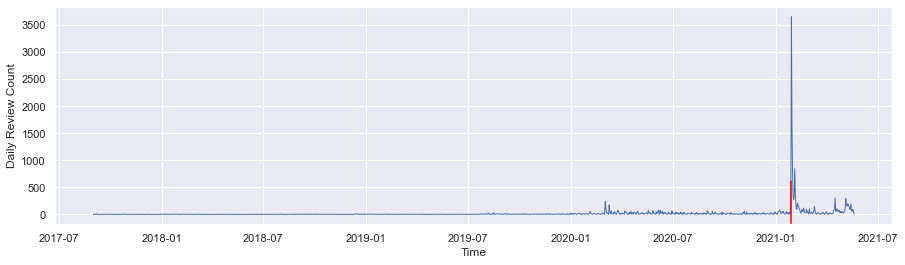

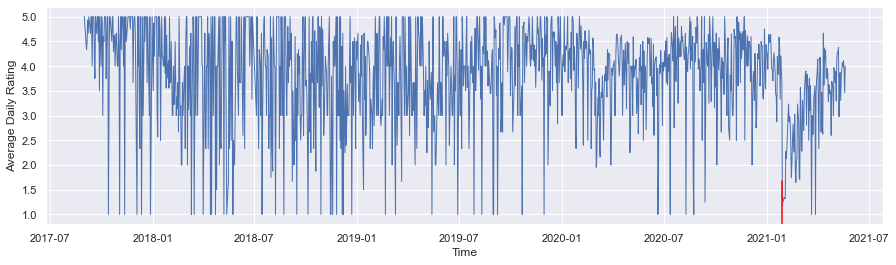

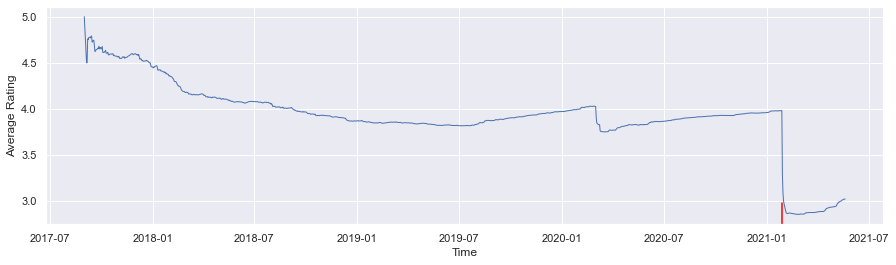

In [553]:
# Graphing for the average rating score vs. time 

raw_df['date'] = pd.to_datetime(raw_df['date']).dt.date # Remove time in the time stamp
avg_rating_df = raw_df[['rating','date']].groupby(['date']).agg(['mean', 'count']) # Group rows with identical dates and calculate the mean 
avg_rating_df.columns = avg_rating_df.columns.get_level_values(0) # Flatten the multi-indexed dataframe
avg_rating_df.columns = ['ave_daily_rating', 'daily_count'] # Rename the dataframe
avg_rating_df['avg_rating'] = 0

# Created a new column called avg_rating
total_rating = 0
total_count = 0
for i in range(0,len(avg_rating_df)):
    total_rating, total_count = total_rating + avg_rating_df['daily_count'].iloc[i]*avg_rating_df['ave_daily_rating'].iloc[i], total_count + avg_rating_df['daily_count'].iloc[i]
    avg_rating_df['avg_rating'].iloc[i] = total_rating/total_count

# avg_rating_df.head()
import seaborn as sns
# Plot count vs. time
sns.set(rc={'figure.figsize':(15, 4)})
avg_rating_df['daily_count'].plot(linewidth=1.0)
plt.axvline(pd.to_datetime("2021-01-28"),ymin=0,ymax=0.2,color='red')
plt.ylabel("Daily Review Count")
plt.xlabel("Time")
plt.show()

# Plot ave daily rating vs. time
sns.set(rc={'figure.figsize':(15, 4)})
avg_rating_df['ave_daily_rating'].plot(linewidth=1.0)
plt.axvline(pd.to_datetime("2021-01-28"),ymin=0,ymax=0.2,color='red')
plt.ylabel("Average Daily Rating")
plt.xlabel("Time")
plt.show()

# Plot average rating vs. time
sns.set(rc={'figure.figsize':(15, 4)})
avg_rating_df['avg_rating'].plot(linewidth=1.0)
plt.axvline(pd.to_datetime("2021-01-28"),ymin=0,ymax=0.1,color='red')
plt.ylabel("Average Rating")
plt.xlabel("Time")
plt.show()


<font size="5">Comment:</font><br>
The red vertical line indicates the date 2021-01-28, the day when Robinhood decided to deploy controversial measures to stop tradings of certain stocks. The daily review count spiked on that day and a few days later, and remained a relatively high level to this day compared to its historical values. 

The average daily rating, ranging from 0 to 5, appears very noisy due to low review counts up until Jan 2021. However, a significant dip can be seen around 2021-01-28. With a large addition of reviews around that time, we can deduce, with certainty, that a burst of negative reviews occured that was not due to data noise.



Next, we are going to divide the dataset into two: reviews before and after 2021-01-28 form two different dataframes. Data acquired earlier than 2021-01-28 will be used for training models whereas data later than that will be analyzed according to the trained models.

<font size="3"></font><br>

<font size="5">3. Feature Engineering:</font><br>

<font size="3"></font><br>

In [562]:
# Getting rid of unwanted information, combine text and title, convert date into is_before

start_date = '2021-01-28'
full_df = pd.DataFrame(columns = ['is_before', 'text', 'rating'])
full_df['text'] = raw_df['title']+' '+raw_df['review'] # Combine review title and review 
full_df['is_before'] = pd.to_datetime(raw_df['date'])<pd.to_datetime(start_date)
full_df['rating'] = raw_df['rating']
full_df.head(5)


,is_before,text,rating
0,True,Great But Buggy Robinhood has a great concept ...,4
1,True,"Excellent, but improvement idea First off, usi...",5
2,False,I wish you had more crypto and coins in genera...,5
3,False,Just needs a human when things go wrong As of ...,3
4,False,Power in your hands Robinhood gives you the po...,5


In [272]:
# utility function for standard text cleaning
def text_cleaner(text):
#     Remove new line symbols
    text = re.sub('[\n]','',text)
    text = re.sub('[\r]','',text)
    text = re.sub("[\[].*?[\]]",'',text)
    text = text.lower()
    text = re.sub('https?://\S+|www\.\S+', '', text)
    return text

full_df['text'] = full_df['text'].apply(text_cleaner)
full_df.dropna(how='any',inplace=True)

nlp = spacy.load('en_core_web_sm')

# New stop words list 
customize_stop_words = [
'robinhood','Robinhood','stock','stocks','app','IOS','rh','robin','company','hood'
]

# Mark them as stop words
for w in customize_stop_words:
    nlp.vocab[w].is_stop = True

# Parse each dataframe row and remove punctuations and stop words

for i in tqdm(range(0,len(full_df))):

    sentence = nlp(full_df['text'].iloc[i])
    full_df['text'].iloc[i] = " ".join(
        [token.lemma_ for token in sentence if not token.is_punct and not token.is_stop])
    
full_df.to_csv(file_path+'preprocessed_review.csv')

100%|████████████████████████████████████████████████████████████████████████████| 26320/26320 [05:09<00:00, 84.98it/s]


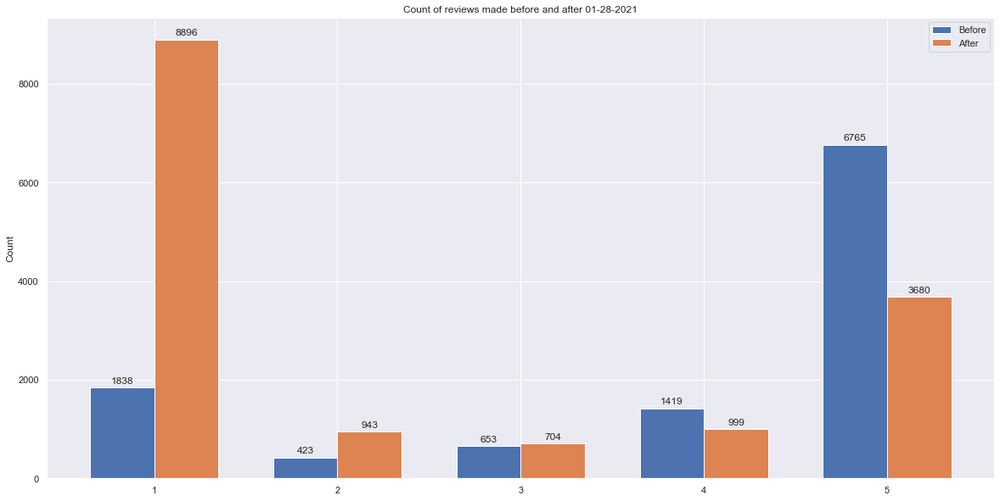

,Rating,Before date count,After date count
0,1,1838,8896
1,2,423,943
2,3,653,704
3,4,1419,999
4,5,6765,3680


In [563]:
count_number_df = pd.DataFrame(columns=['Rating','Before date count','After date count'])
tmp_list = []
count_number_df['Rating'] = list(range(1,6))
for rating in [1,2,3,4,5]:
    tmp_list.append(len(full_df[(full_df['is_before']==True)&(full_df['rating']==rating)]))
count_number_df['Before date count'] = tmp_list
tmp_list = []
for rating in [1,2,3,4,5]:
    tmp_list.append(len(full_df[(full_df['is_before']==False)&(full_df['rating']==rating)]))
count_number_df['After date count'] = tmp_list



labels = ['1', '2', '3', '4', '5']
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars



fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, list(count_number_df['Before date count']), width, label='Before')
rects2 = ax.bar(x + width/2, list(count_number_df['After date count']), width, label='After')
fig.set_figwidth(20)
fig.set_figheight(10)
# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Count')
ax.set_title('Count of reviews made before and after 01-28-2021')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

ax.bar_label(rects1, padding=3)
ax.bar_label(rects2, padding=3)


plt.show()
count_number_df



The number of reviews before and after the said date across different ratings are extremely unbalanced, so a training set is going to be created and used for machine learning trainings. The training set will contain equal amount of reviews for each rating before and after the date. The amount of reviews will be the lesser of the two counts for each row.

In [113]:
sample_sizes = list(count_number_df[['Before date count','After date count']].min(axis=1))
sample_dict = dict(zip([1,2,3,4,5],sample_sizes))
train_df = pd.DataFrame(columns = ['is_before', 'text', 'rating']) # Create an empty dataframe as train_df to later append data

for rating in [1,2,3,4,5]:
    train_df = train_df.append(full_df[(full_df['is_before']==True)&(full_df['rating']==rating)].sample(sample_dict[rating]))
    train_df = train_df.append(full_df[(full_df['is_before']==False)&(full_df['rating']==rating)].sample(sample_dict[rating]))
    
train_df.reset_index(drop=True,inplace=True)

train_df

,is_before,text,rating
0,True,Couldn’t even set up an account I downloaded i...,1
1,True,Losing Hundreds Due to Glitch This morning Rob...,1
2,True,Recent update is buggy This latest update drop...,1
3,True,No phone support? I had an issue with my accou...,1
4,True,Can’t trust them They’ve always had glitches a...,1
...,...,...,...
15181,False,BEST WAY TO INVEST!! User friendly. The ROBINH...,5
15182,False,Great app. Even offers crypto I would say a go...,5
15183,False,Robinhood With everybody flooding the market a...,5
15184,False,"From the name I mean, seriously, why do 20% of...",5


<font size="5">NLP Models:</font><br>

<font size="3"></font><br>

In [158]:
# Language Model 1: Bag-of-words
from sklearn.feature_extraction.text import CountVectorizer



rating = 1
sentences = train_df[(train_df['rating'] == rating)]#&(train_df['is_before']==False)]
vectorizer_bow = CountVectorizer(analyzer='word')
bow_X = vectorizer_bow.fit_transform(sentences["text"])

# Vectorized Matrix
bow_df = pd.DataFrame(bow_X.toarray(), columns=vectorizer_bow.get_feature_names())
bow_df

,00,000,008,00am,00pm,01,02,023,03,04,...,ytd,yuppie,zack,zendesk,zero,zeroed,zm,zone,zoom,zzzz
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3671,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3672,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3673,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3674,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [159]:
# Language Model 2: TF-IDF
from sklearn.feature_extraction.text import TfidfVectorizer


vectorizer_tfidf = TfidfVectorizer(
                             min_df=1, # Only use words that appear at least n times.
                             stop_words='english', 
                             lowercase=True, # Convert everything to lowercase (because Alice in Wonderland has the HABIT of CAPITALIZING WORDS for EMPHASIS).
                             use_idf=True, # You definitely want to use inverse document frequencies in your weighting.
                             norm=u'l2', # Apply a correction factor so that longer paragraphs and shorter paragraphs get treated equally.
                             smooth_idf=True # Add 1 to all document frequencies, as if an extra document existed that used every word once. This prevents divide-by-zero errors.
                            )




tfidf_X = vectorizer_tfidf.fit_transform(sentences['text'])

tfidf_df = pd.DataFrame(tfidf_X.toarray(), columns=vectorizer_tfidf.get_feature_names())
tfidf_df

,00,000,008,00am,00pm,01,02,023,03,04,...,ytd,yuppie,zack,zendesk,zero,zeroed,zm,zone,zoom,zzzz
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3671,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3672,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3673,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3674,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [160]:
# Language Model 3: Word2vec
import gensim

# Convert string type row values back to list containing parsed words,to be later fed into word2vec pipeline

# for i in range(0,len(sentences)):

    
#     sentences['w2v_text'].iloc[i] = sentences['text'].iloc[i].split()
sentences['w2v_text'] = sentences['text'].apply(lambda x: x.split(' '))

model = gensim.models.Word2Vec(
    sentences["w2v_text"],
    workers=8, #Set the number of threads to run in parallel 
    min_count=1,#Set the minimum word count threshold
    window=6, #Set the number of words around the target word to consider
    sg=0, #Use CBOW because your corpus is small
    sample=1e-3, #Penalize frequent words.
    vector_size =300,
    hs=1 #Use hierarchical softmax.
)

# Train and extract word2vec model

word2vec_arr = np.zeros((sentences.shape[0],300))


for i, sentence in enumerate(sentences["w2v_text"]):
    word2vec_arr[i,:] = np.mean([model.wv[lemma] for lemma in sentence],axis=0)


word2vec_arr = pd.DataFrame(word2vec_arr)
word2vec_arr

,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
0,0.012882,-0.082600,-0.036877,0.024525,-0.056941,0.100406,-0.011628,-0.112714,0.112997,-0.298540,...,0.033430,0.379599,0.221208,0.255753,0.181724,0.643767,0.176477,-0.085508,-0.056259,-0.079370
1,-0.029855,-0.031874,0.023342,0.068638,-0.091325,0.056415,0.061925,0.126634,0.131382,-0.179097,...,0.094099,0.322397,0.229489,0.110091,0.188770,0.481043,0.211064,-0.032227,0.064023,-0.053956
2,0.018398,0.197069,0.128628,0.066449,0.013047,-0.063184,0.082816,0.189997,0.121306,-0.181778,...,-0.028948,0.233853,0.128875,0.137003,0.040585,0.348004,0.077928,-0.077911,0.029184,-0.079112
3,-0.038134,0.251521,0.196104,0.381764,-0.110116,-0.107071,0.103178,0.497916,0.126987,-0.272430,...,-0.190977,0.121913,0.016335,0.024658,0.182524,0.427713,0.317656,0.072576,0.163198,-0.204093
4,-0.126762,0.053350,0.178110,0.060122,-0.088864,0.025898,0.085919,0.205012,0.111003,-0.200711,...,0.255914,0.534616,0.434774,0.164177,0.415416,0.526690,0.127742,-0.010996,0.105252,0.043398
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3671,-0.042154,0.027090,0.113015,-0.136327,0.069951,-0.155457,0.492332,0.284577,0.133086,-0.229537,...,0.238959,0.315042,0.251406,0.073415,0.289202,0.074094,-0.150598,-0.099424,-0.024372,0.020906
3672,-0.004165,0.208385,0.145974,-0.008440,0.010706,-0.196605,0.368498,0.317070,0.106133,-0.126658,...,0.154951,0.212299,0.174004,0.063127,0.204265,0.157690,-0.051808,-0.104172,0.007103,0.042561
3673,-0.118170,0.018666,0.073450,0.061618,-0.151688,0.012617,0.408072,0.264143,0.166910,-0.291885,...,0.267848,0.239912,0.222694,0.045331,0.380392,0.392333,0.225830,0.031165,-0.033710,0.024897
3674,-0.073752,0.123189,0.162887,-0.029679,-0.046852,-0.123071,0.409412,0.293263,0.100028,-0.219520,...,0.203550,0.232415,0.211997,0.045033,0.261941,0.132541,-0.051738,-0.026350,-0.021736,0.036905


<font size="5">Dimensionality Reduction:</font><br>

<font size="3"></font><br>

In [161]:
#Import preprocessing
import numpy as np
import matplotlib.pyplot as plt
import time
import pandas as pd
import scipy
import seaborn as sns




#Import Dimensionality Reduction 
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap


#Import Evaluating methods
from sklearn import  metrics



from IPython.core.display import display, HTML
#display(HTML("<style>.container { width:100% !important; }</style>"))




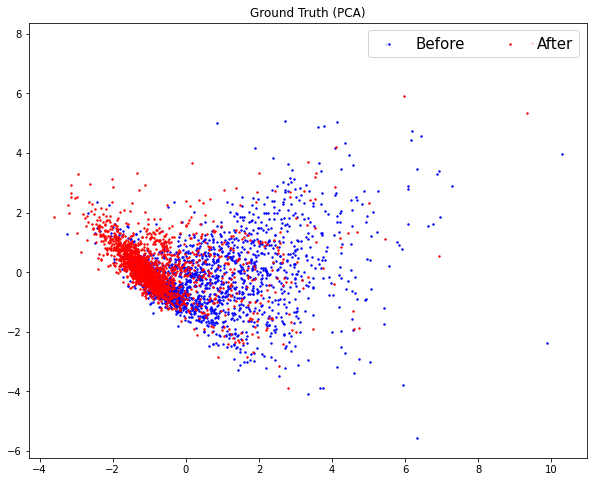

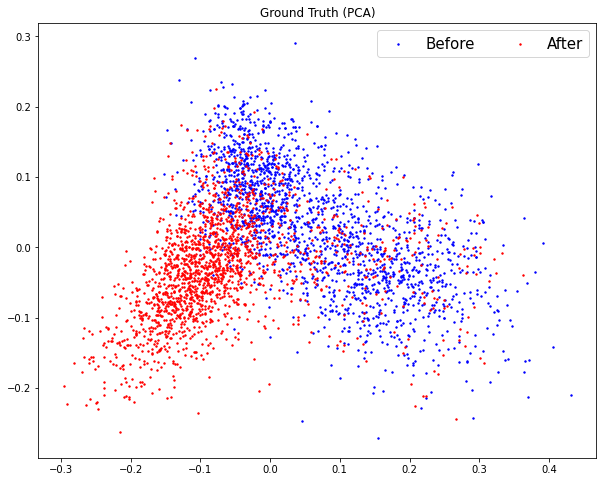

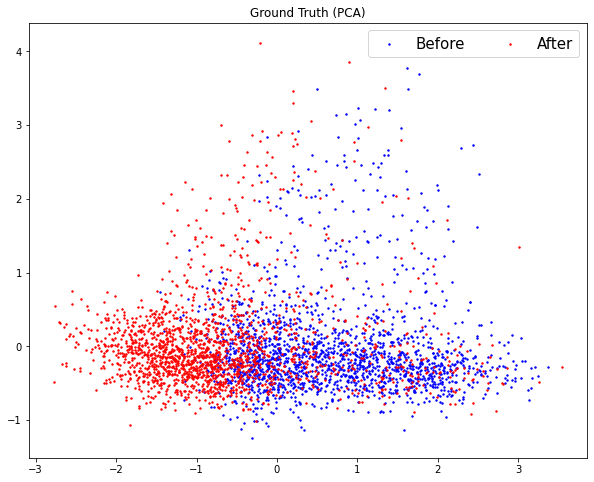

In [168]:
# 1. PCA
is_before = list(sentences['is_before'])


for nlp_model in [bow_df,tfidf_df,word2vec_arr]:
# nlp_model = word2vec_arr


    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(nlp_model)


    f = plt.figure()
    f.set_figwidth(10)
    f.set_figheight(8)

    plt.title('Ground Truth (PCA)')
    before_plot = plt.scatter([X_pca[i,0] for i in range(len(sentences)) if is_before[i] == True],[X_pca[i,1] for i in range(len(sentences)) if is_before[i] == True],s=2,c='b')
    after_plot = plt.scatter([X_pca[i,0] for i in range(len(sentences)) if is_before[i] == False],[X_pca[i,1] for i in range(len(sentences)) if is_before[i] == False],s=2,c='r')
    plt.legend((before_plot,after_plot),
               ('Before', 'After'),
               scatterpoints=1,
               loc='upper right',
               ncol=3,
               fontsize=15)
    plt.show()

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 3676 samples in 4.982s...
[t-SNE] Computed neighbors for 3676 samples in 25.165s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3676
[t-SNE] Computed conditional probabilities for sample 2000 / 3676
[t-SNE] Computed conditional probabilities for sample 3000 / 3676
[t-SNE] Computed conditional probabilities for sample 3676 / 3676
[t-SNE] Mean sigma: 1.692049
[t-SNE] KL divergence after 250 iterations with early exaggeration: 100.189911
[t-SNE] KL divergence after 300 iterations: 3.479367


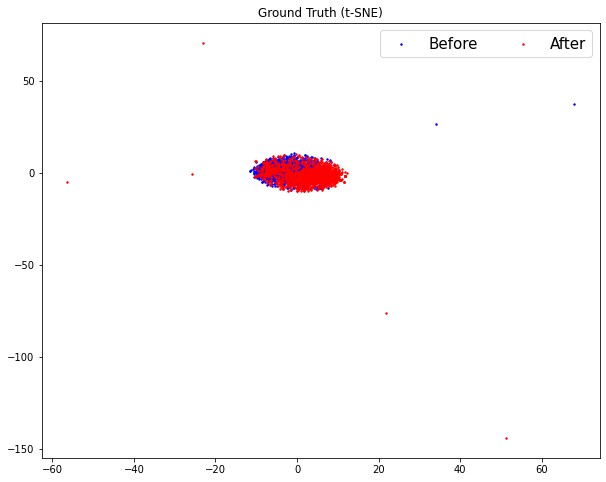

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 3676 samples in 4.885s...
[t-SNE] Computed neighbors for 3676 samples in 24.368s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3676
[t-SNE] Computed conditional probabilities for sample 2000 / 3676
[t-SNE] Computed conditional probabilities for sample 3000 / 3676
[t-SNE] Computed conditional probabilities for sample 3676 / 3676
[t-SNE] Mean sigma: 0.231335
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.237289
[t-SNE] KL divergence after 300 iterations: 3.027503


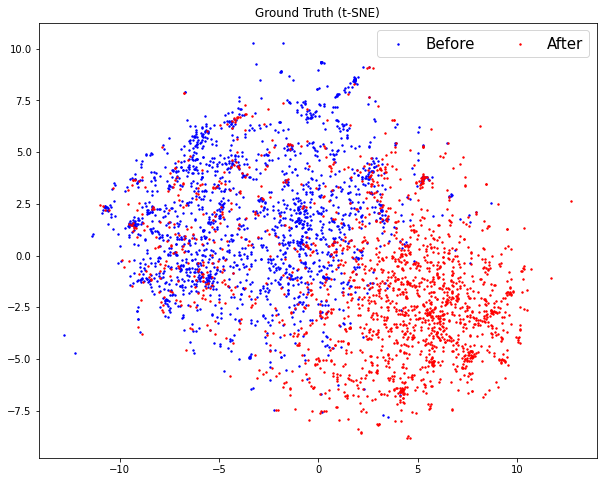

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 3676 samples in 0.142s...
[t-SNE] Computed neighbors for 3676 samples in 0.627s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3676
[t-SNE] Computed conditional probabilities for sample 2000 / 3676
[t-SNE] Computed conditional probabilities for sample 3000 / 3676
[t-SNE] Computed conditional probabilities for sample 3676 / 3676
[t-SNE] Mean sigma: 0.381031
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.469551
[t-SNE] KL divergence after 300 iterations: 1.939296


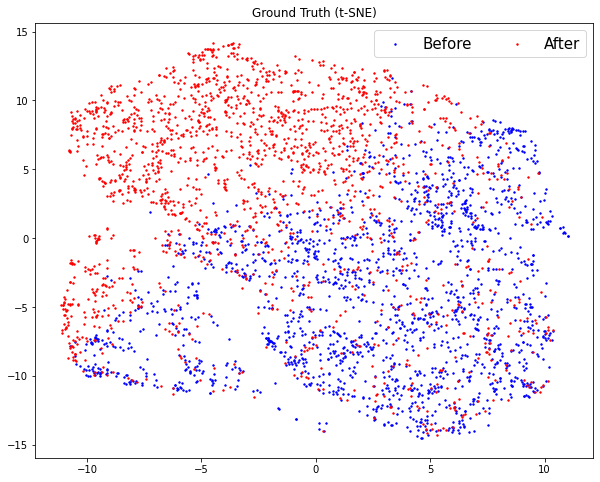

In [269]:
# 2. t-SNE
# for perplexity_ in np.arange(5,55,5):

for nlp_model in [bow_df,tfidf_df,word2vec_arr]:
# nlp_model = word2vec_arr

    tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300, n_jobs = -1)
    X_tsne = tsne.fit_transform(nlp_model)

    f = plt.figure()
    f.set_figwidth(10)
    f.set_figheight(8)

    plt.title('Ground Truth (t-SNE)')
    before_plot = plt.scatter([X_tsne[i,0] for i in range(len(sentences)) if is_before[i] == True],[X_tsne[i,1] for i in range(len(sentences)) if is_before[i] == True],s=2,c='b')
    after_plot = plt.scatter([X_tsne[i,0] for i in range(len(sentences)) if is_before[i] == False],[X_tsne[i,1] for i in range(len(sentences)) if is_before[i] == False],s=2,c='r')
    plt.legend((before_plot,after_plot),
               ('Before', 'After'),
               scatterpoints=1,
               loc='upper right',
               ncol=3,
               fontsize=15)
    plt.show()

parameters: min_dist: 0.99 neighbor: 200


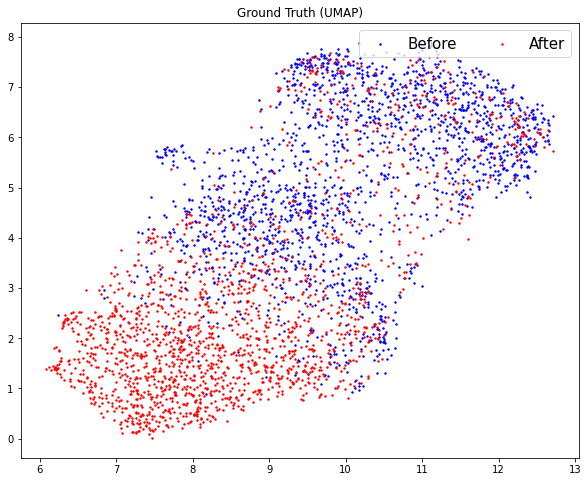

parameters: min_dist: 0.99 neighbor: 200


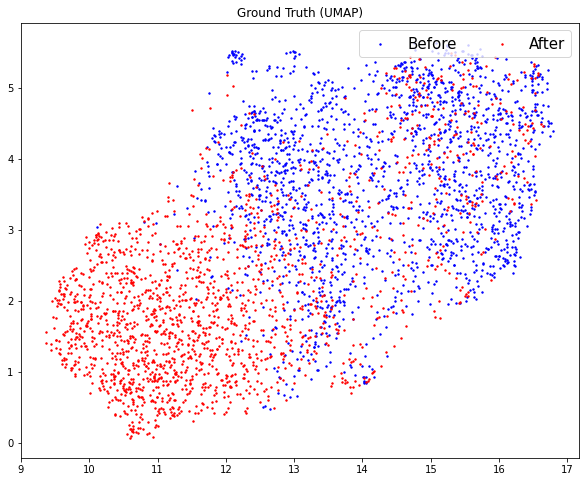

parameters: min_dist: 0.99 neighbor: 200


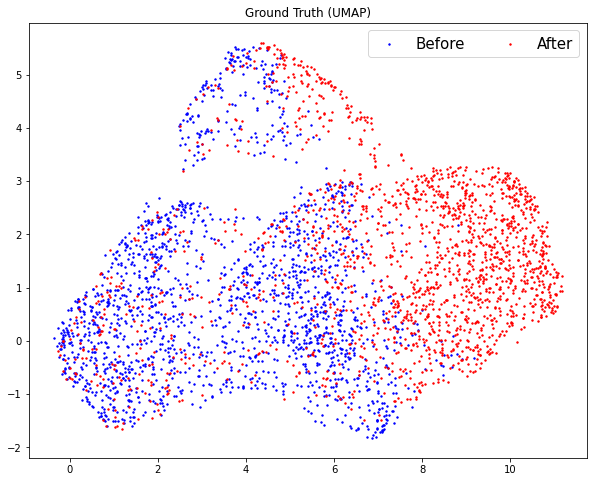

In [268]:
# 3. UMAP

# nlp_model = word2vec_arr
# for metric_ in ['euclidean','correlation','cosine']:
#     for mindist_ in (0.0, 0.1, 0.25, 0.5, 0.8, 0.99):
#         for neighbor_ in (2, 5, 10, 20, 50, 100, 200):
# for neighbor_ in (4,5,10,20,50,100,200):
#     for mindist_ in (0.0, 0.1, 0.25, 0.5, 0.8, 0.99):

for nlp_model in [bow_df,tfidf_df,word2vec_arr]:
    X_umap = umap.UMAP(n_neighbors=100,
                          min_dist=0.2,
                          metric='cosine').fit_transform(nlp_model)
    print('parameters: min_dist: '+str(mindist_)+' neighbor: '+str(neighbor_))
    f = plt.figure()
    f.set_figwidth(10)
    f.set_figheight(8)

    plt.title('Ground Truth (UMAP)')
    before_plot = plt.scatter([X_umap[i,0] for i in range(len(sentences)) if is_before[i] == True],[X_umap[i,1] for i in range(len(sentences)) if is_before[i] == True],s=2,c='b')
    after_plot = plt.scatter([X_umap[i,0] for i in range(len(sentences)) if is_before[i] == False],[X_umap[i,1] for i in range(len(sentences)) if is_before[i] == False],s=2,c='r')
    plt.legend((before_plot,after_plot),
               ('Before', 'After'),
               scatterpoints=1,
               loc='upper right',
               ncol=3,
               fontsize=15)
    plt.show()

<font size="5">Comment:</font><br>

The NLP models and dimensionality reduction technique combination suggests that UMAP coupled with either bag-of-words, tfidf or word2vec yields the best separation. As such, UMAP and TF-IDF is selected for training machine learning models.


<font size="3"></font><br>

<font size="5">4. Unsupervised Machine Learning Models:</font><br>

<font size="3"></font><br>

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Import Models
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture



In [385]:
# We will apply  UMAP and TF-IDF to all ratings. X_umap_list stores X_umap info for each rating. is_before_train
# stores info about 
X_umap_train = {}
is_before_train = {}
for rating in [1,2,3,4,5]:
    
    sentences = train_df[(train_df['rating'] == rating)]#&(train_df['is_before']==False)]
    # sentences = full_df[(full_df['rating'] == rating)]#&(train_df['is_before']==False)]
    is_before_train[rating] = list(sentences['is_before'])

    vectorizer_tfidf = TfidfVectorizer(
                                 min_df=1, # Only use words that appear at least n times.
                                 stop_words='english', 
                                 lowercase=True, # Convert everything to lowercase (because Alice in Wonderland has the HABIT of CAPITALIZING WORDS for EMPHASIS).
                                 use_idf=True, # You definitely want to use inverse document frequencies in your weighting.
                                 norm=u'l2', # Apply a correction factor so that longer paragraphs and shorter paragraphs get treated equally.
                                 smooth_idf=True # Add 1 to all document frequencies, as if an extra document existed that used every word once. This prevents divide-by-zero errors.
                                )

    tfidf_X = vectorizer_tfidf.fit_transform(sentences['text'])
    tfidf_df = pd.DataFrame(tfidf_X.toarray(), columns=vectorizer_tfidf.get_feature_names())
    nlp_model = tfidf_df
    X_umap = umap.UMAP(n_neighbors=100,
                              min_dist=0.2,
                              metric='cosine').fit_transform(nlp_model)
    X_umap_train[rating] = X_umap


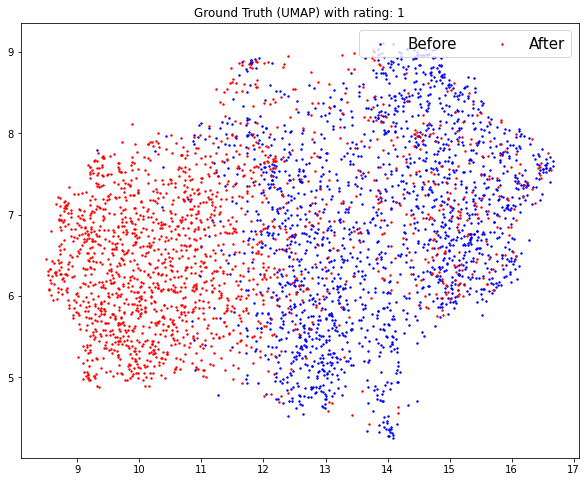

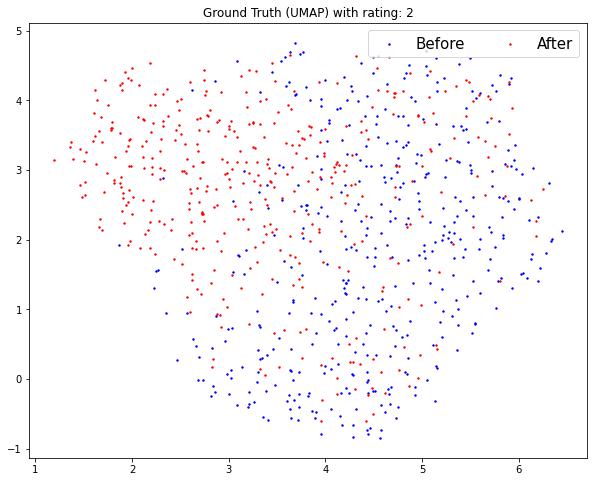

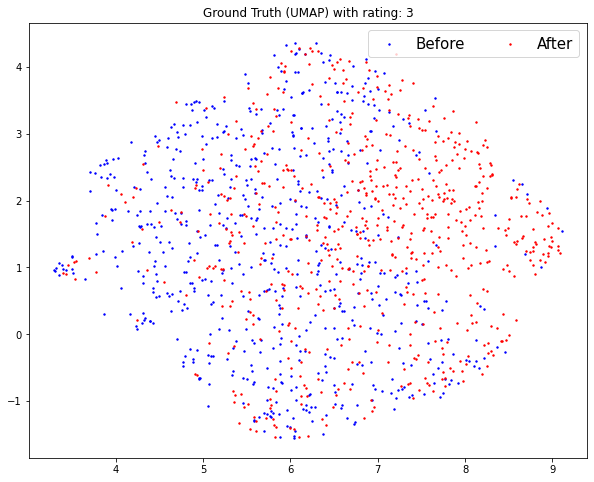

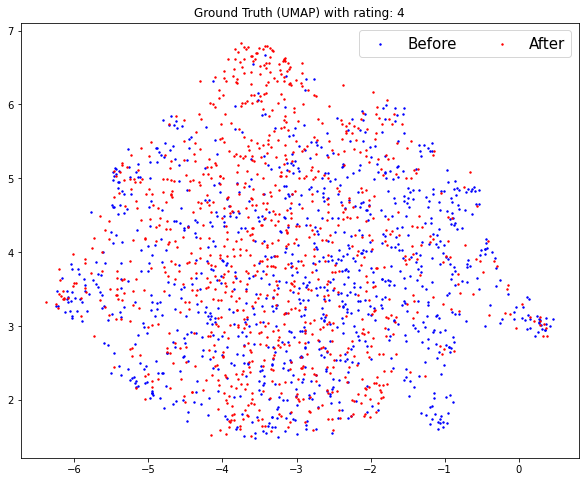

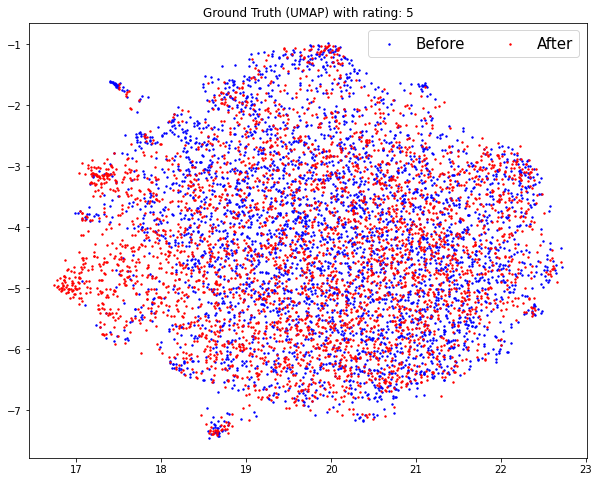

In [398]:
for rating in [1,2,3,4,5]:
    is_before = is_before_train[rating]
    X_umap = X_umap_train[rating]
    f = plt.figure()
    f.set_figwidth(10)
    f.set_figheight(8)

    plt.title('Ground Truth (UMAP) with rating: '+str(rating))
    before_plot = plt.scatter([X_umap[i,0] for i in range(len(is_before)) if is_before[i] == True],[X_umap[i,1] for i in range(len(is_before)) if is_before[i] == True],s=2,c='b')
    after_plot = plt.scatter([X_umap[i,0] for i in range(len(is_before)) if is_before[i] == False],[X_umap[i,1] for i in range(len(is_before)) if is_before[i] == False],s=2,c='r')
    plt.legend((before_plot,after_plot),
               ('Before', 'After'),
               scatterpoints=1,
               loc='upper right',
               ncol=3,
               fontsize=15)
    
    plt.savefig(file_path+'UMAP_train_rating('+str(rating)+').png')
    plt.show()


<font size="5">Comment:</font><br>

After applying tokenization and dimensionality reduction techniques, one can find that reviews with rating 1 has the clearest separation. The two types of reviews (before and after) gradually merge into one cluster as rating moves from 1 to 5. We have to manually set a threshold where machine learning models become ineffective or even incorrect. One easy threshold would be the adjusted Rand index, or ARI, such that any trained models having a specific ARI lower than a specific value, say 0.08. will be neglected, and all data are considered 'biased'.


The following section we will consider rating = 1 cases to determine the best unsupervised learning models, as rating = 1 case is very common and easily separable.

<font size="3"></font><br>

------------------K-means-------------
ARI Score: 0.3280378361796571
Silhouette Score:0.48407423


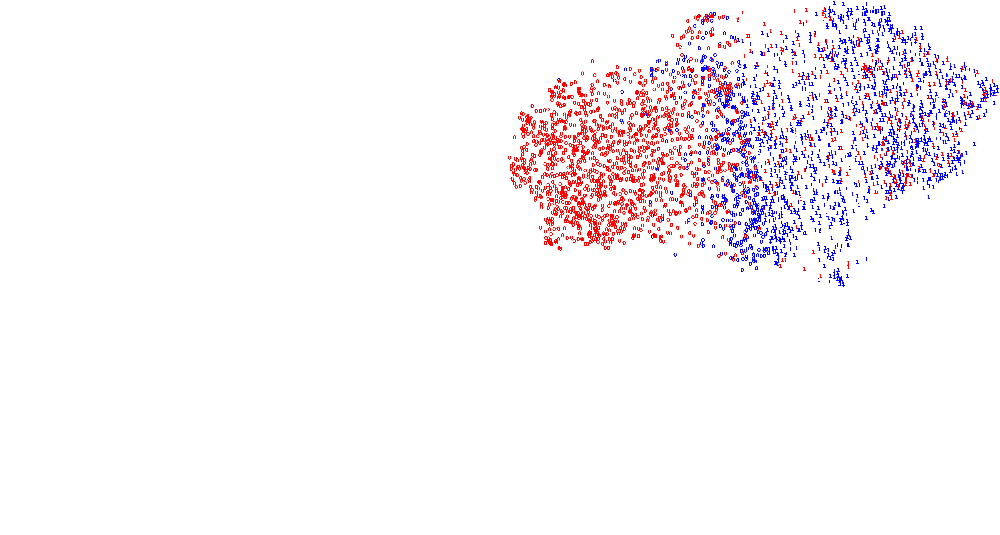

------------------Hierarchical clustering-------------
ARI Score: 0.15025384958920832
Silhouette Score:0.27801168


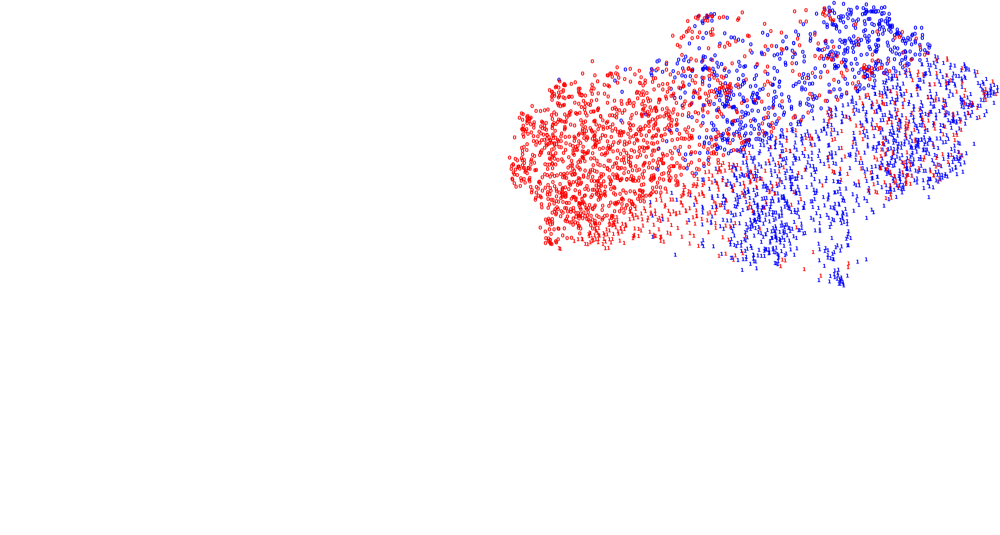

------------------GMC-------------
ARI Score: 0.363886227403702
Silhouette Score:0.48278952


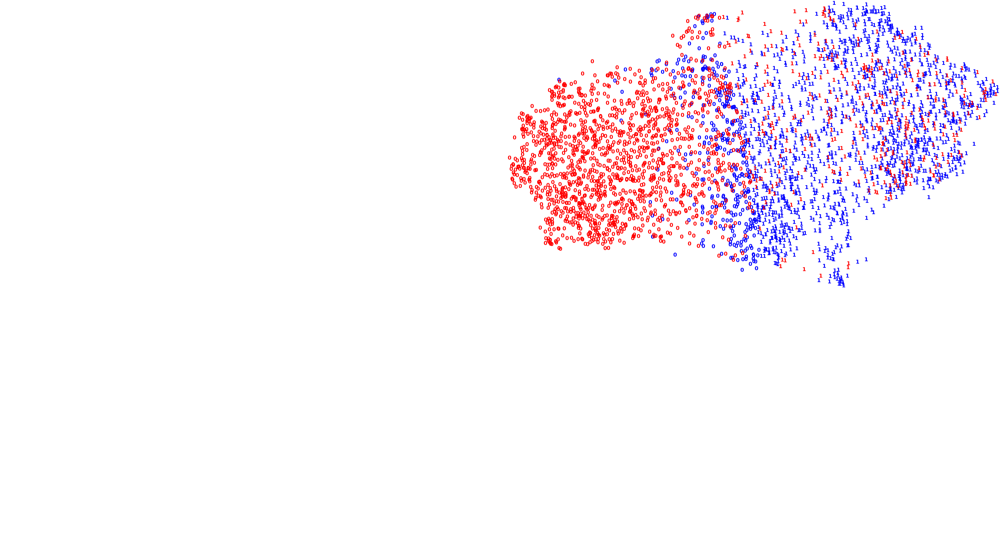

In [421]:
# Let's test train models for rating = 1

# K-means
X_umap = X_umap_train[1]
is_before = is_before_train[1]

k_means = KMeans(n_clusters=2, random_state=0)
y_pred_kmeans = abs(1-k_means.fit_predict(X_umap))
y = [int(i) for i in is_before]
print('------------------K-means-------------')
print('ARI Score: '+str(metrics.adjusted_rand_score(y, y_pred_kmeans)))
print('Silhouette Score:'+str(metrics.silhouette_score(X_umap, y_pred_kmeans, metric='euclidean')))
plt.figure(figsize=(10,10))
colours = 'rbg'
for i in range(len(y_pred_kmeans)):
    plt.text(X_umap[i, 0], X_umap[i, 1], str(y_pred_kmeans[i]),
             color=colours[int(is_before[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

# plt.xticks([])
# plt.yticks([])
plt.axis('off')
plt.show()



# Hierarchical clustering
hier_clust = AgglomerativeClustering(linkage='complete',affinity='cosine',n_clusters=2)
y_pred_hierc = hier_clust.fit_predict(X_umap)
y = [int(i) for i in is_before]
print('------------------Hierarchical clustering-------------')
print('ARI Score: '+str(metrics.adjusted_rand_score(y, y_pred_hierc)))
print('Silhouette Score:'+str(metrics.silhouette_score(X_umap, y_pred_hierc, metric='euclidean')))
plt.figure(figsize=(10,10))
colours = 'rbg'
for i in range(len(y_pred_hierc)):
    plt.text(X_umap[i, 0], X_umap[i, 1], str(y_pred_hierc[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

# plt.xticks([])
# plt.yticks([])
plt.axis('off')
plt.show()


# Gaussian mixture clustering
gmc = GaussianMixture(n_components=2, random_state=0,covariance_type = 'spherical')
y_pred_gmc = gmc.fit_predict(X_umap)
y = [int(i) for i in is_before]
print('------------------GMC-------------')
print('ARI Score: '+str(metrics.adjusted_rand_score(y, y_pred_gmc)))
print('Silhouette Score:'+str(metrics.silhouette_score(X_umap, y_pred_gmc, metric='euclidean')))
plt.figure(figsize=(10,10))
colours = 'rbg'
for i in range(len(y_pred_gmc)):
    plt.text(X_umap[i, 0], X_umap[i, 1], str(y_pred_gmc[i]),
             color=colours[int(is_before[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

# plt.xticks([])
# plt.yticks([])
plt.axis('off')
plt.show()

<font size="5">Comment:</font><br>

Comparison across three unsupervised learning models, i.e. k-means, hierarchical clustering and gaussian mixture clustering(GMC), suggests that GMC does the best job identifying "unbiased" 1 star ratings located on the left in red color, while maintaining the highest ARI. So GMC will be selected for other ratings as well, and will be applied to the full dataframe.
<font size="3"></font><br>

In [424]:
# Now lets apply GMC to all ratings, keeping only those having ARI greater than 0.08
for rating in [1,2,3,4,5]:
    X_umap = X_umap_train[rating]
    is_before = is_before_list[rating]

    gmc = GaussianMixture(n_components=2, random_state=0,covariance_type = 'spherical')
    y_pred_gmc = gmc.fit_predict(X_umap)
    y = [int(i) for i in is_before]
    print(f'GMC ARI Score for rating {rating}: '+str(metrics.adjusted_rand_score(is_before, y_pred_gmc)))

GMC ARI Score for rating 1: 0.363886227403702
GMC ARI Score for rating 2: 0.0378129048334271
GMC ARI Score for rating 3: 0.010497920607631741
GMC ARI Score for rating 4: 0.03531099814054836
GMC ARI Score for rating 5: 2.6787369293655846e-05


<font size="5">Comment:</font><br>

GMC fits marginally better for rating = 1 than does for the rest, which means that rating = 1 cases contain significantly many biased reviews. Rating = 2 to 5 might contain biased reviews that are not picked up by GMC models, but they are not statistically significant to impact the result.
<font size="3"></font><br>

In [425]:
# We will apply  UMAP and t-SNE to all ratings. X_umap_list stores X_umap info for each rating. is_before_list
# stores info about is_before column for each ratings
X_umap_full = {}
is_before_full = {}
for rating in [1]:
    
    sentences = full_df[(full_df['rating'] == rating)]#&(train_df['is_before']==False)]
    # sentences = full_df[(full_df['rating'] == rating)]#&(train_df['is_before']==False)]
    is_before_full[rating] = list(sentences['is_before'])

    vectorizer_tfidf = TfidfVectorizer(
                                 min_df=1, # Only use words that appear at least n times.
                                 stop_words='english', 
                                 lowercase=True, # Convert everything to lowercase (because Alice in Wonderland has the HABIT of CAPITALIZING WORDS for EMPHASIS).
                                 use_idf=True, # You definitely want to use inverse document frequencies in your weighting.
                                 norm=u'l2', # Apply a correction factor so that longer paragraphs and shorter paragraphs get treated equally.
                                 smooth_idf=True # Add 1 to all document frequencies, as if an extra document existed that used every word once. This prevents divide-by-zero errors.
                                )

    tfidf_X = vectorizer_tfidf.fit_transform(sentences['text'])
    tfidf_df = pd.DataFrame(tfidf_X.toarray(), columns=vectorizer_tfidf.get_feature_names())
    nlp_model = tfidf_df
    X_umap = umap.UMAP(n_neighbors=100,
                              min_dist=0.2,
                              metric='cosine').fit_transform(nlp_model)
    X_umap_full[rating] = X_umap


ARI Score: 0.2256858531173768


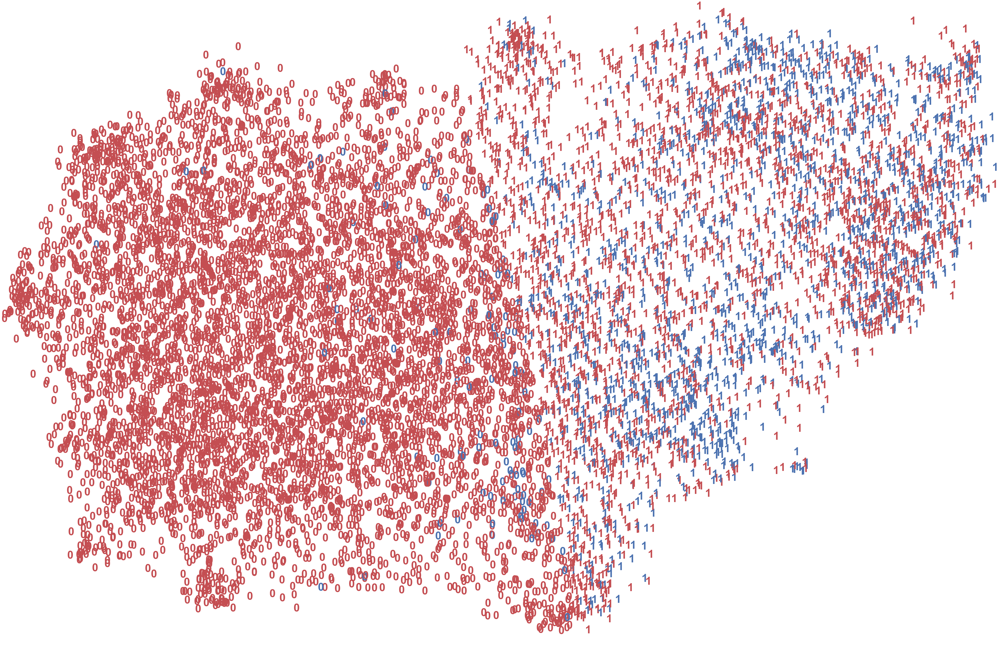

In [565]:
X_umap = X_umap_full[1]
is_before = is_before_full[1]
y_pred_gmc = abs(1-gmc.fit_predict(X_umap))
print('ARI Score: '+str(metrics.adjusted_rand_score([int(i) for i in is_before], y_pred_gmc)))
plt.figure(figsize=(10,10))
colours = 'rbg'
for i in range(len(y_pred_gmc)):
    plt.text(X_umap[i, 0], X_umap[i, 1], str(y_pred_gmc[i]),
             color=colours[int(is_before[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

# plt.xticks([])
# plt.yticks([])
plt.axis('off')
plt.show()

<font size="5">Comment:</font><br>

As can be seen above, the GMC model does fairly well for a larger data set - the full available reviews. The compact red '0's on the right represent biased reviews from rating = 1 category, whereas red '1's on the left are different from its counterparts and similar to likely unbiased blue '1's, disbite having the same rating as 1. 
<font size="3"></font><br>

In [568]:
rating = 1

# Compute list of bias indicators when GMC model says that the predicted review does not fall in the corresponding rating (= 1)
bias_count = []
for i in range(len(y_pred_gmc)):
    if y_pred_gmc[i] == 0:
        bias_count.append(1)
    else:
        bias_count.append(0)
        
full_df['is_biased'] = [np.nan for i in range(len(full_df))]
full_df.loc[full_df.rating==rating,'is_biased']=bias_count
full_df.fillna(0,inplace=True)

unbiased_df = full_df.loc[full_df.is_biased==0]
biased_df = full_df.loc[full_df.is_biased==1]

def rating_avg(df):
    return(df['rating'].mean())

print('Original Avg. Rating: '+str(round(rating_avg(full_df),2)))
print('Adjusted Avg. Rating: '+str(round(rating_avg(unbiased_df),2)))

Original Avg. Rating: 3.02
Adjusted Avg. Rating: 3.66


<font size="5">Comment:</font><br>

After removing biased reivews, we can see that the adjusted rating is significantly higher than the original rating.

Now, we can examine the topics and emphatic words in biased reviews made after 2021-01-28 with rating of 1.
<font size="3"></font><br>

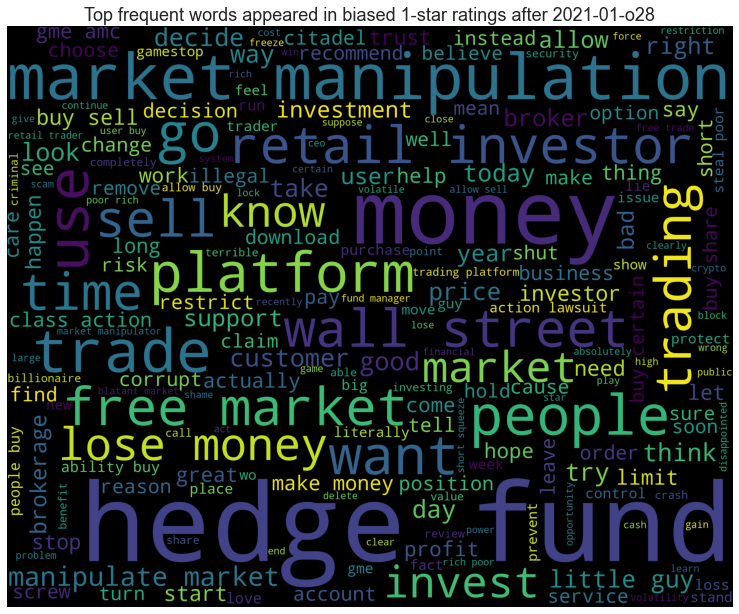

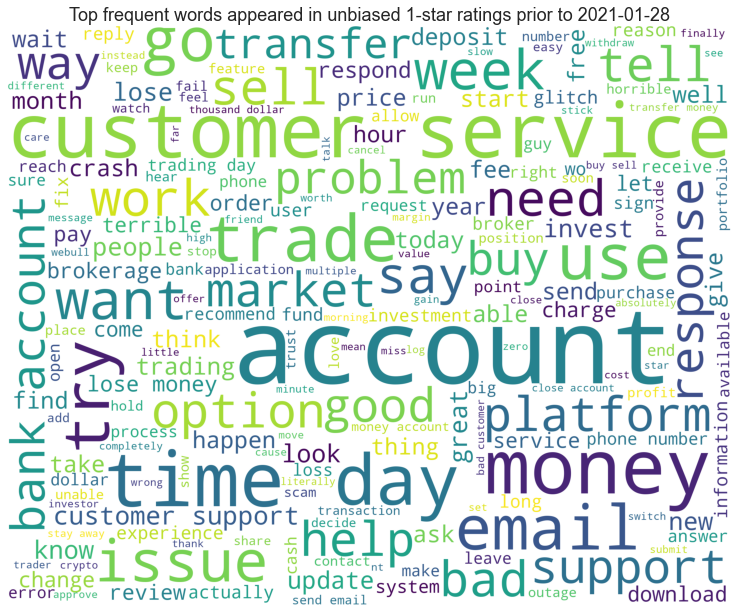

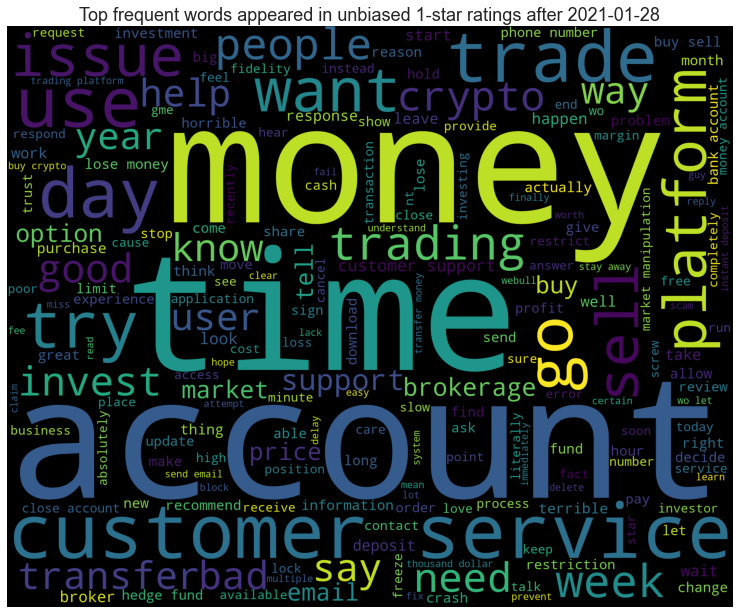

In [549]:
# We are going to visualize the most frequent words appeared in the biased 1-star ratings using wordcloud

from wordcloud import WordCloud,STOPWORDS
def wordcloud_draw(data, color,title):
    STOPWORDS.update(['Robinhood','stock','app','company','stocks','robinhood'])
    words = ' '.join(data)
    cleaned_word = " ".join([word for word in words.split()
                            ])
    wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color=color,
                      width=2500,
                      height=2000
                     ).generate(cleaned_word)
    plt.figure(1,figsize=(13, 13))
    plt.imshow(wordcloud)
    plt.title(title,fontsize=18)
    plt.axis('off')
    plt.show()
data = biased_df.loc[biased_df.is_before==False,'text']

wordcloud_draw(data,'black','Top frequent words appeared in biased 1-star ratings after 2021-01-o28')

wordcloud_draw(unbiased_df[(unbiased_df.is_before==True)&(unbiased_df.rating==1)]['text'],'white','Top frequent words appeared in unbiased 1-star ratings prior to 2021-01-28')

wordcloud_draw(unbiased_df[(unbiased_df.is_before==False)&(unbiased_df.rating==1)]['text'],'black','Top frequent words appeared in unbiased 1-star ratings after 2021-01-28')

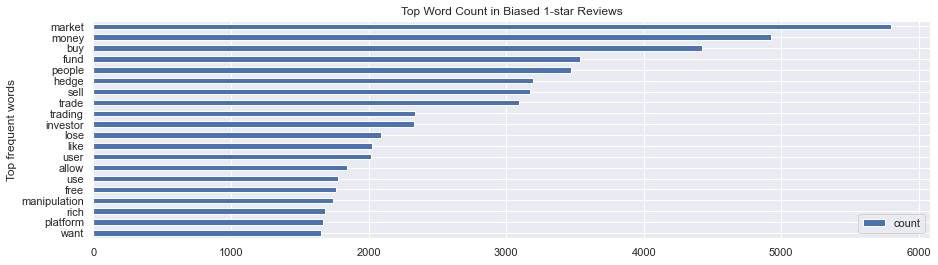

In [542]:
# most frequent words

vectorizer_bow = CountVectorizer(analyzer='word')
bow_X = vectorizer_bow.fit_transform(data)

word_count = pd.DataFrame({'Top frequent words': vectorizer_bow.get_feature_names(), 'count': np.asarray(bow_X.sum(axis=0))[0]})

word_count.sort_values('count', ascending=False).set_index('Top frequent words')[:20].sort_values('count', ascending=True).plot(kind='barh')
plt.title('Top Word Count in Biased 1-star Reviews')
plt.show()

In [536]:
# Top 10 topics/key words in the biased reviews for 1-star ratings 
from sklearn.decomposition import LatentDirichletAllocation

def print_top_words(model, vectorizer, n_top_words):
    feature_names = vectorizer.get_feature_names()
    for topic_idx, topic in enumerate(model.components_):
        message = "\nTopic #%d: " % topic_idx
        message += " ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
    print()

lda = LatentDirichletAllocation(n_components=10, random_state=0)
lda.fit(bow_X)
print_top_words(lda, vectorizer_bow, n_top_words=25)



Topic #0: good limit take user trade guy action option cost investor look broker gme money limited retail business problem week premarket well use know able need

Topic #1: trade user trading platform time sell market order use broker good free price like customer great money brokerage buy interface restrict trust easy recommend service

Topic #2: cancel order share purchase buy morning night amc place market say gamestop account go open message wake block tell transaction sell limit gme try send

Topic #3: buy market sell want money trade purchase allow share people restrict certain trading like free limit ability use invest go manipulation user platform lose gme

Topic #4: protect investor good try interest lie easy action retail relationship come sure time look rich capitalism push thing great average trader recent equal pull fund

Topic #5: people fund hedge money guy market little big lose wall street like buy trade review rich help go time trading care screw want investor let

T

<font size="5">Summary:</font><br>

We have trained an unsupervised machine learing model of Gaussian Mixture Clustering, after tokenizing, dimensionality-reducing the selected subset of the full dataframe. We then applied the trained model to the entire dataframe and made predictions whether a specific review falls in the biased category given its rating and text. We have produced an adjusted average rating after the removal of the biased reviews, yielding 3.66, signiticantly higher than its apparent average rating of 3.02 due to large volume of biased reviews. The successfully identified biased reviews are analyzed to show the rising problems that customers were complaining about. Some keys words include: 'market manipulation', 'loss money', 'GME', 'hedge', 'illegal', which were not present in the unbiased 1-star reviews made prior to 2021-01-28. With the benefit of hindsight, our model successfully captures the key words/problem that made users leave biased reviews, and they match quite well with the news that Robinhood decided to temporarily stop the trading of GME stock, raising angers among Robinhood users. 

<font size="3"></font><br>